In [1]:
from popsborder.scenarios import run_scenarios
from popsborder.inputs import load_configuration, load_scenario_table
from popsborder.outputs import save_scenario_result_to_pandas

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import numpy as np

%matplotlib inline

In [3]:
from pathlib import Path
datadir = Path("data")
# Set a directory for the use case results here
resultsdir = Path("use_cases")
# Make sure the directory exists
resultsdir.mkdir(exist_ok=True)

In [4]:
# Set colors for plots
dark_blue = "#1f78b4ff"
light_blue = "#6db8dfff"
green = "#72c12cff"

## Load scenario tables for use cases
Note that these use cases recreate consignments from historical AQIM inspection data (aqim_box_insp_unit.csv). To run this notebook, the inspection data csv must be saved locally or a different method for generating the consignments should be used. You can edit the scenario tables to use the parameter consignment generator or use a csv of other AQIM or F280 inspection records.

In [5]:
basic_config = load_configuration(datadir / "config.yml")
rate_scenario_table = load_scenario_table(datadir / "contamination_rate_estimation.csv")
inspection_scenario_table = load_scenario_table(datadir / "inspection_scenarios.csv")
consignment_scenario_table = load_scenario_table(datadir / "consignment_scenarios.csv")

## Use Case 1: Estimate contamination rates from high quality inspection data

When inspection data obtained with known statistically valid inspection methods are available, the simulation can be used to estimate the consignment contamination rates by recreating the inspections and calibrating the contamination configuration until similar inspection outcomes are achieved.

In the example below, data from AQIM inspections of cut flower consignments are used to estimate possible contamination rate probability distributions. Note that the contamination rate distribution parameters were estimated by running the simulation, checking the failure rate, and adjusting the distribution parameters until the failure rate matched the AQIM data.

In [6]:
num_consignments = 3313
fitted_contamination_rate_results = run_scenarios(
    config=basic_config,
    scenario_table=rate_scenario_table,
    seed=42,
    num_simulations=100,
    num_consignments=num_consignments,
    detailed=False,
)

Running scenario: rate scenario 1 box
Running scenario: rate scenario 1 stem random
Running scenario: rate scenario 1 stem clustered random
Running scenario: rate scenario 1 stem clustered continuous
Running scenario: rate scenario 2 box
Running scenario: rate scenario 2 stem random
Running scenario: rate scenario 2 stem clustered random
Running scenario: rate scenario 2 stem clustered continuous
Running scenario: rate scenario 3 box
Running scenario: rate scenario 3 stem random
Running scenario: rate scenario 3 stem clustered random
Running scenario: rate scenario 3 stem clustered continuous


In [7]:
df_fitted = save_scenario_result_to_pandas(
    fitted_contamination_rate_results,
    config_columns=[
        "name",
        "consignment name",
        "inspection name",
        "contamination/contamination_rate/parameters",
        "contamination/arrangement",
        "contamination/clustered/distribution",
        "contamination/clustered/contaminated_units_per_cluster",
    ],
    result_columns=[
        "true_contamination_rate",
        "false_neg",
        "intercepted",
        "total_missed_contaminants",
        "total_intercepted_contaminants",
    ],
)

In [8]:
df_fitted['failure rate'] = df_fitted["intercepted"] / num_consignments

In [9]:
# Format dataframe
column_names = (["scenario name", "consignment name", "inspection name", "beta parameters", "contaminant arrangement", 
    "cluster distribution", "infested units per cluster", "mean contamination rate", "missed", "intercepted", 
    "missed contaminants", "intercepted contaminants", "failure rate"])
df_contamination_pretty = df_fitted.copy()

df_contamination_pretty.columns = column_names
df_contamination_pretty.iloc[:,6] = df_contamination_pretty.iloc[:,6].round(decimals=4)
df_contamination_pretty.iloc[:,7] = df_contamination_pretty.iloc[:,7].round(decimals=4)
df_contamination_pretty

,scenario name,consignment name,inspection name,beta parameters,contaminant arrangement,cluster distribution,infested units per cluster,mean contamination rate,missed,intercepted,missed contaminants,intercepted contaminants,failure rate
0,rate scenario 1 box,mean 0.0027 sd 0.0282 box,box hypergeometric 0.1 random,"[0.009, 3.3062]",random,None,NaN,0.0028,85.44,151.45,51050.20,494596.36,0.045714
1,rate scenario 1 stem random,mean 0.0027 sd 0.0282 item random,box hypergeometric 0.1 random,"[0.009, 3.3062]",random,None,NaN,0.0027,26.22,207.22,300.69,530851.86,0.062548
2,rate scenario 1 stem clustered random,mean 0.0027 sd 0.0282 item clustered random,box hypergeometric 0.1 random,"[0.009, 3.3062]",clustered,random,40.0,0.0027,65.37,165.72,12905.59,501225.23,0.050021
3,rate scenario 1 stem clustered continuous,mean 0.0027 sd 0.0282 item clustered cont,box hypergeometric 0.1 random,"[0.009, 3.3062]",clustered,continuous,40.0,0.0027,66.15,169.04,12651.53,583531.88,0.051023
4,rate scenario 2 box,mean 0.00188 sd 0.019 box,box hypergeometric 0.1 random,"[0.0098, 5.1882]",random,None,NaN,0.0019,91.19,149.34,63904.48,336585.82,0.045077
5,rate scenario 2 stem random,mean 0.00188 sd 0.019 item random,box hypergeometric 0.1 random,"[0.0098, 5.1882]",random,None,NaN,0.0019,28.70,210.20,350.51,342886.61,0.063447
6,rate scenario 2 stem clustered random,mean 0.00188 sd 0.019 item clustered random,box hypergeometric 0.1 random,"[0.0098, 5.1882]",clustered,random,40.0,0.0019,72.09,165.71,12266.43,372491.83,0.050018
7,rate scenario 2 stem clustered continuous,mean 0.00188 sd 0.019 item clustered cont,box hypergeometric 0.1 random,"[0.0098, 5.1882]",clustered,continuous,40.0,0.0019,72.64,165.05,13284.49,324264.25,0.049819
8,rate scenario 3 box,mean 0.001 sd 0.0095 box,box hypergeometric 0.1 random,"[0.0111, 11.0582]",random,None,NaN,0.0010,101.70,141.02,48605.85,145856.45,0.042566
9,rate scenario 3 stem random,mean 0.001 sd 0.0095 item random,box hypergeometric 0.1 random,"[0.0111, 11.0582]",random,None,NaN,0.0010,31.85,212.13,312.63,237927.03,0.064030


In [71]:
# Save results to csv
df_contamination_pretty.to_csv(resultsdir / "contamination_rate_results.csv")

In [11]:
# If loading results from saved csv, uncomment and run this chunk.
#df_contamination_pretty = pd.read_csv(resultsdir / "contamination_rate_results.csv")

## Use Case 2: Measure the effect of deviations from sampling protocols

We used the calibrated contamination rate distribution with mean 0.0027 and standard deviation 0.0282 with a clustered contaminant arrangement to run sampling scenarios with fixed consignment assumptions. The outcomes of these scenarios provide information about the relative impacts of changes to inspection protocols. 

In [13]:
# Hiding very long output for this cell (many printed messages related to clusters)
#%%capture capt
num_consignments = 3313
inspection_scenario_results = run_scenarios(
    config=basic_config,
    scenario_table=inspection_scenario_table,
    seed=42,
    num_simulations=100,
    num_consignments=num_consignments,
    detailed=False,
)
# uncomment to print output if desired
#capt.show()

Running scenario: inspection scenario 1
Running scenario: inspection scenario 2
Running scenario: inspection scenario 3
Running scenario: inspection scenario 4
Running scenario: inspection scenario 5
Running scenario: inspection scenario 6
Running scenario: inspection scenario 7
Running scenario: inspection scenario 8
Running scenario: inspection scenario 9
Running scenario: inspection scenario 10
Running scenario: inspection scenario 11
Running scenario: inspection scenario 12
Running scenario: inspection scenario 13
Running scenario: inspection scenario 14
Running scenario: inspection scenario 15
Running scenario: inspection scenario 16
Running scenario: inspection scenario 17
Running scenario: inspection scenario 18


In [14]:
df_inspections = save_scenario_result_to_pandas(
    inspection_scenario_results,
    config_columns=[
        "name",
        "inspection/unit",
        "inspection/sample_strategy",
        "inspection/proportion/value",
        "inspection/hypergeometric/detection_level",
        "inspection/selection_strategy",
        "inspection/cluster/cluster_selection",

    ],
    result_columns=[
        "true_contamination_rate",
        "max_missed_contamination_rate",
        "avg_missed_contamination_rate",
        "max_intercepted_contamination_rate",
        "avg_intercepted_contamination_rate",
        "avg_boxes_opened_completion",
        "pct_boxes_opened_completion",
        "avg_boxes_opened_detection",
        "pct_boxes_opened_detection",
        "avg_items_inspected_completion",
        "pct_items_inspected_completion",
        "avg_items_inspected_detection",
        "pct_items_inspected_detection",
        "false_neg",
        "intercepted",
        "total_missed_contaminants",
        "total_intercepted_contaminants",
        "num_boxes",
        "num_items",
    ],
)

In [15]:
df_inspections['failure rate'] = df_inspections["intercepted"] / num_consignments
contaminated_consignments = df_inspections["false_neg"] + df_inspections["intercepted"]
df_inspections["interception rate"] = df_inspections["intercepted"] / contaminated_consignments
df_inspections["% missed contaminants"] = ((df_inspections["total_missed_contaminants"] / (df_inspections["total_missed_contaminants"] +
     df_inspections["total_intercepted_contaminants"])) * 100)

In [16]:
column_names = (["name", "inspection unit", "sample strategy", "sample parameter", "selection strategy", "cluster selection", 
    "avg contamination rate", "max missed contamination rate", "avg missed contamination rate", "max intercepted contamination rate", 
    "avg intercepted contamination rate", "avg boxes opened per inspection completion", "pct boxes opened per simulation completion", 
    "avg boxes opened per inspection detection", "pct boxes opened per simulation detection", "avg items inspected per inspection completion", 
    "pct items inspected per simulation completion", "avg items inspected per inspection detection", "pct items inspected per simulation detection", 
    "missed", "intercepted", "missed contaminants", "intercepted contaminants", "total boxes", "total items", "failure rate", 
    "interception rate", "% missed contaminants", "sample size method", "selection method"])

In [17]:
df_inspections_pretty = df_inspections.loc[:, df_inspections.columns != 'inspection/hypergeometric/detection_level'].copy()
hypergeometric_parameters = df_inspections.iloc[[0,1,2,3,4,5,6,7,12,13,14,15],4]
df_inspections_pretty.iloc[[0,1,2,3,4,5,6,7,12,13,14,15],3] = hypergeometric_parameters
df_inspections_pretty.iloc[:,3] = df_inspections_pretty.iloc[:,3].astype(str)

In [18]:
df_inspections_pretty["sample size method"] = df_inspections_pretty[['inspection/sample_strategy', 'inspection/proportion/value']].agg(' '.join, axis=1)

In [19]:
df_inspections_pretty.iloc[:,5].fillna("", inplace=True)

In [20]:
df_inspections_pretty["selection method"] = (df_inspections_pretty[["inspection/unit", 'inspection/selection_strategy', 
    'inspection/cluster/cluster_selection']].agg(' '.join, axis=1))

In [21]:
df_inspections_pretty.columns = column_names

In [22]:
df_inspections_pretty.iloc[:,6:11] = df_inspections_pretty.iloc[:,6:11].round(decimals=4)
df_inspections_pretty.iloc[:,[11,13,15,17]] = df_inspections_pretty.iloc[:,[11,13,15,17]].astype(int)
df_inspections_pretty.iloc[:,[12,14,16,18]] = df_inspections_pretty.iloc[:,[12,14,16,18]].round(decimals=2)
df_inspections_pretty.iloc[:,19:25] = df_inspections_pretty.iloc[:,19:25].astype(int)
df_inspections_pretty.iloc[:,25:27] = df_inspections_pretty.iloc[:,25:27].round(decimals=4)
df_inspections_pretty.iloc[:,27] = df_inspections_pretty.iloc[:,27].round(decimals=2)
df_inspections_pretty

,name,inspection unit,sample strategy,sample parameter,selection strategy,cluster selection,avg contamination rate,max missed contamination rate,avg missed contamination rate,max intercepted contamination rate,...,intercepted,missed contaminants,intercepted contaminants,total boxes,total items,failure rate,interception rate,% missed contaminants,sample size method,selection method
0,inspection scenario 1,items,hypergeometric,0.05,cluster,random,0.0026,0.3696,0.0221,0.5792,...,24,47089,41746,167429,33485852,0.0073,0.1045,53.01,hypergeometric 0.05,items cluster random
1,inspection scenario 2,items,hypergeometric,0.05,cluster,interval,0.0027,0.3668,0.0218,0.6059,...,23,47342,43352,167591,33518334,0.0072,0.1022,52.20,hypergeometric 0.05,items cluster interval
2,inspection scenario 3,items,hypergeometric,0.05,convenience,,0.0027,0.4148,0.0251,0.5963,...,18,56451,34242,167591,33518334,0.0055,0.0774,62.24,hypergeometric 0.05,items convenience
3,inspection scenario 4,items,hypergeometric,0.05,random,,0.0027,0.0435,0.0033,0.5891,...,90,4760,85775,167172,33434426,0.0274,0.3898,5.26,hypergeometric 0.05,items random
4,inspection scenario 5,items,hypergeometric,0.1,cluster,random,0.0027,0.4338,0.0255,0.6015,...,17,55313,34760,167456,33491248,0.0053,0.0761,61.41,hypergeometric 0.1,items cluster random
5,inspection scenario 6,items,hypergeometric,0.1,cluster,interval,0.0027,0.4188,0.0251,0.5945,...,17,56501,34192,167591,33518334,0.0053,0.0743,62.30,hypergeometric 0.1,items cluster interval
6,inspection scenario 7,items,hypergeometric,0.1,convenience,,0.0027,0.4997,0.0302,0.5468,...,10,69759,20934,167591,33518334,0.0031,0.0436,76.92,hypergeometric 0.1,items convenience
7,inspection scenario 8,items,hypergeometric,0.1,random,,0.0026,0.0834,0.0057,0.5723,...,70,9310,78507,167197,33439452,0.0212,0.3033,10.60,hypergeometric 0.1,items random
8,inspection scenario 9,items,proportion,0.02,cluster,random,0.0027,0.2799,0.0145,0.5887,...,46,19661,68479,167381,33476334,0.0140,0.1994,22.31,proportion 0.02,items cluster random
9,inspection scenario 10,items,proportion,0.02,cluster,interval,0.0027,0.2507,0.0134,0.6118,...,47,18758,71936,167591,33518334,0.0143,0.2025,20.68,proportion 0.02,items cluster interval


In [72]:
# Save results to csv
df_inspections_pretty.to_csv(resultsdir / "inspection_scenario_results.csv")

In [24]:
# If loading results from saved csv, uncomment and run this chunk.
#df_inspections_pretty = pd.read_csv(resultsdir / "inspection_scenario_results.csv")

In [25]:
colors = {"hypergeometric 0.1": dark_blue, "hypergeometric 0.05": light_blue, "proportion 0.02":green}
patch_1 = mpatches.Patch(color=light_blue, label="hypergeometric 0.05")
patch_2 = mpatches.Patch(color=dark_blue, label="hypergeometric 0.1")
patch_3 = mpatches.Patch(color=green, label="proportion 0.02")

In [26]:
inspected_per_interception = ((df_inspections_pretty['pct items inspected per simulation completion'] * 0.01 * df_inspections_pretty["total items"]) /
    (df_inspections_pretty["intercepted"]))
opened_per_interception = ((df_inspections_pretty['pct boxes opened per simulation completion'] * 0.01 * df_inspections_pretty["total boxes"]) /
    df_inspections_pretty["intercepted"])

C:\Users\kmontgomery\AppData\Local\Temp\ipykernel_19252\708875733.py:15: MatplotlibDeprecationWarning: Support for passing numbers through unit converters is deprecated since 3.5 and support will be removed two minor releases later; use Axis.convert_units instead.
  plt.yticks(ticks=[])


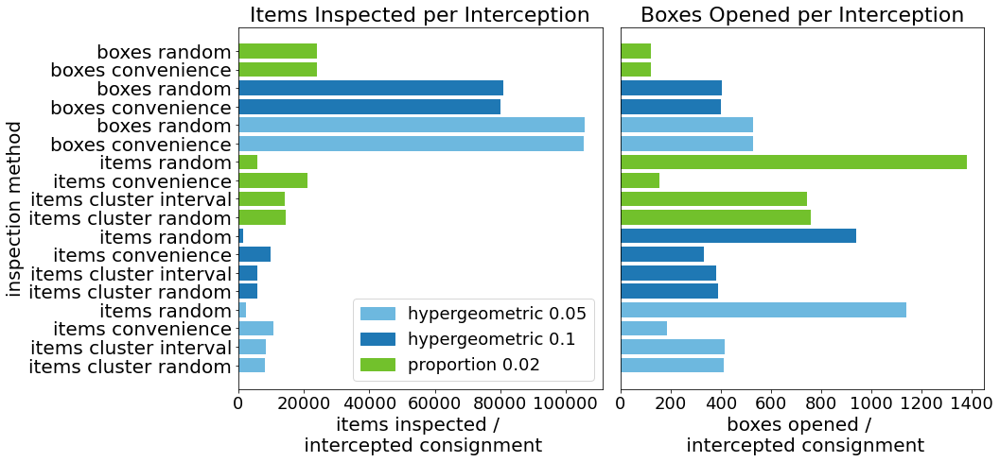

In [27]:
plt.figure(figsize=(15,7))
plt.subplot(121)
plt.subplots_adjust(wspace=0.05,left=0.24,right=0.97, bottom=0.16, top=0.92)
plt.barh(df_inspections_pretty["name"], inspected_per_interception, color=df_inspections_pretty['sample size method'].replace(colors))
plt.title("Items Inspected per Interception", fontsize=22)
plt.ylabel("inspection method", fontsize=20)
plt.xlabel("items inspected / \n intercepted consignment", fontsize=20)
plt.yticks(ticks=np.arange(18),labels=df_inspections_pretty["selection method"].str.strip(), fontsize=20)
plt.xticks(fontsize=18)
plt.legend(handles=[patch_1,patch_2,patch_3], loc = "lower right", fontsize=18)
plt.subplot(122)
plt.barh(df_inspections_pretty["name"], opened_per_interception, color=df_inspections_pretty['sample size method'].replace(colors))
plt.title("Boxes Opened per Interception", fontsize=22)
plt.xlabel("boxes opened / \n intercepted consignment", fontsize=20)
plt.yticks(ticks=[])
plt.xticks(fontsize=18)
plt.savefig(resultsdir / "inspection_scenario_plots.png")

plt.show()


In [28]:
def rand_jitter(arr):
    stdev = .01 * (max(arr) - min(arr))
    return arr + np.random.randn(len(arr)) * stdev

In [29]:
box_marker = Line2D([0], [0], marker='s', color='w', label='box inspection unit', markerfacecolor='dimgray', markersize=9)
item_marker = Line2D([0], [0], marker='^', color='w', label='item inspection unit', markerfacecolor='dimgray', markersize=11)
random_selection = mpatches.Patch(fc="w", fill=False, edgecolor='none', linewidth=0, label="random selection")
convenience_selection = mpatches.Patch(fc="w", fill=False, edgecolor='none', linewidth=0, label="convenience selection")
clusterrandom_selection = mpatches.Patch(fc="w", fill=False, edgecolor='none', linewidth=0, label="cluster random selection")
clusterinterval_selection = mpatches.Patch(fc="w", fill=False, edgecolor='none', linewidth=0, label="cluster interval selection")

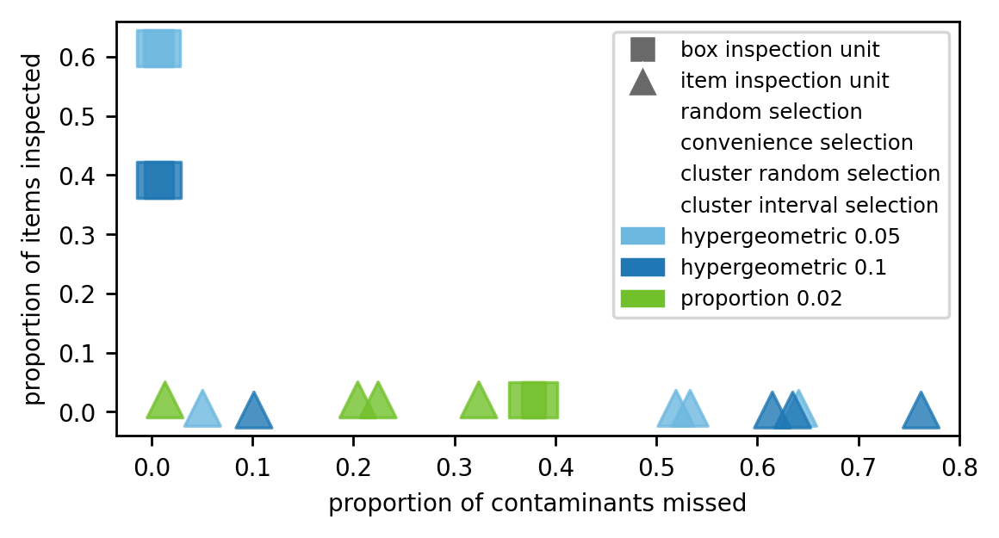

In [30]:
np.random.seed(5)

names = list(df_inspections_pretty["name"].values)
selection = list(df_inspections_pretty["selection strategy"].values)

x = df_inspections_pretty["missed contaminants"].divide(df_inspections_pretty["intercepted contaminants"]+df_inspections_pretty["missed contaminants"])
y = df_inspections_pretty["pct items inspected per simulation completion"] * 0.01

x = rand_jitter(x)

is_box = df_inspections_pretty['inspection unit'] == "boxes"
is_item = df_inspections_pretty['inspection unit'] == "items"

x_item = x[is_item]
x_box = x[is_box]
y_item = y[is_item]
y_box = y[is_box]

plt.figure(figsize=(4.5,2.5), dpi=250)
plt.subplots_adjust(left=0.1, bottom=0.18, right=0.97, top=0.95)
plt.scatter(x_item, y_item, s=12**2, alpha=0.8, marker="^", c=df_inspections_pretty['sample size method'][is_item].replace(colors))
plt.scatter(x_box, y_box, s=12**2, alpha=0.8, marker="s", c=df_inspections_pretty['sample size method'][is_box].replace(colors))
plt.xlabel("proportion of contaminants missed", size=8)
plt.ylabel("proportion of items inspected", size=8)
plt.tick_params(axis='both', which='major', labelsize=8)
plt.ylim(-0.04, 0.66)
plt.legend(handles=[box_marker,item_marker,random_selection,convenience_selection,clusterrandom_selection,clusterinterval_selection,patch_1,patch_2,patch_3], loc = "upper right", fontsize=7)
plt.savefig(resultsdir / "inspection_scenario_scatter.png")

##  Use Case 3: Measure the effect of changes in consignment characteristics

We used the simulation with fixed inspection assumptions to answer questions about how inspection outcomes change with changes in consignments. Using the AQIM inspection protocol (box unit, hypergeometric sample with 0.1 detection level and 0.95 confidence level, random selection), we simulated multiple scenarios to reflect the following consignment scenarios:

* 10,000,000 items packaged using three cargo scenarios: Maritime scenario with large consignments (100 - 160 boxes) with 700 items per box, Air scenario with mid-sized consignments (20 - 100 boxes) with 200 items per box, and direct-to-consumer scenario with very small consignments (1 - 50 boxes) with 100 items per box.
* Changes in contamination rate variability
* Changes in contaminant arrangement (random vs clustered)

### First, run the packaging scenarios. Each requires a different number of consignments per simulation to contain 10,000,000 items.

In [31]:
num_consignments = 833
air_scenario_results = run_scenarios(
    config=basic_config,
    scenario_table=consignment_scenario_table[0:1],
    seed=42,
    num_simulations=100,
    num_consignments=num_consignments,
    detailed=False,
)

Running scenario: consignment scenario 1


In [32]:
num_consignments = 110
maritime_scenario_results = run_scenarios(
    config=basic_config,
    scenario_table=consignment_scenario_table[1:2],
    seed=42,
    num_simulations=100,
    num_consignments=num_consignments,
    detailed=False,
)

Running scenario: consignment scenario 2


In [33]:
num_consignments = 4000
dtc_scenario_results = run_scenarios(
    config=basic_config,
    scenario_table=consignment_scenario_table[2:3],
    seed=42,
    num_simulations=100,
    num_consignments=num_consignments,
    detailed=False,
)

Running scenario: consignment scenario 3


In [34]:
df_cargo_10M = save_scenario_result_to_pandas(
    air_scenario_results+maritime_scenario_results+dtc_scenario_results,
    config_columns=[
        "name",
        "consignment name",
        "consignment/parameter_based/boxes/min",
        "consignment/parameter_based/boxes/max",
        "consignment/items_per_box/default",
        "contamination/contamination_unit",
        "contamination/contamination_rate/distribution",
        "contamination/contamination_rate/parameters",
        "contamination/arrangement",
        "contamination/clustered/distribution",
        "contamination/clustered/contaminated_units_per_cluster",
        "contamination/clustered/random/cluster_item_width",
    ],
    result_columns=[
        "true_contamination_rate",
        "max_missed_contamination_rate",
        "avg_missed_contamination_rate",
        "max_intercepted_contamination_rate",
        "avg_intercepted_contamination_rate",
        "avg_boxes_opened_completion",
        "pct_boxes_opened_completion",
        "avg_boxes_opened_detection",
        "pct_boxes_opened_detection",
        "avg_items_inspected_completion",
        "pct_items_inspected_completion",
        "avg_items_inspected_detection",
        "pct_items_inspected_detection",
        "false_neg",
        "intercepted",
        "total_missed_contaminants",
        "total_intercepted_contaminants",
        "num_boxes",
        "num_items",
    ],
)

In [35]:
df_cargo_10M['failure rate'] = df_cargo_10M["intercepted"] / num_consignments
contaminated_consignments = df_cargo_10M["false_neg"] + df_cargo_10M["intercepted"]
df_cargo_10M["interception rate"] = df_cargo_10M["intercepted"] / contaminated_consignments
df_cargo_10M["contaminated_consignments"] = contaminated_consignments
df_cargo_10M["% missed contaminants"] = ((df_cargo_10M["total_missed_contaminants"] / 
    (df_cargo_10M["total_missed_contaminants"] + df_cargo_10M["total_intercepted_contaminants"])) * 100)

In [36]:
# Format dataframe 
column_names = (["name", "consignment name", "items per box", "contamination unit", "contamination parameters", 
    "contaminant arrangement", "cluster distribution", "contaminated units per cluster", "cluster width", "avg contamination rate", 
    "avg missed contamination rate", "avg intercepted contamination rate", "avg boxes opened per inspection", 
    "pct boxes opened per simulation", "avg items inspected per inspection", "pct items inspected per simulation", "missed contaminants", 
    "intercepted contamininants", "total boxes", "total items", "interception rate", "contaminated_consignments", "% missed contaminants"])
df_cargo_10M_pretty = df_cargo_10M

In [37]:
df_cargo_10M_pretty.iloc[:,12:35] = df_cargo_10M_pretty.iloc[:,12:35].round(decimals=3)
df_cargo_10M_pretty = df_cargo_10M_pretty.iloc[:,[0,1,4,5,7,8,9,10,11,12,14,16,17,18,21,22,27,28,29,30,32,33,34]]
df_cargo_10M_pretty.columns = column_names
df_cargo_10M_pretty

,name,consignment name,items per box,contamination unit,contamination parameters,contaminant arrangement,cluster distribution,contaminated units per cluster,cluster width,avg contamination rate,...,pct boxes opened per simulation,avg items inspected per inspection,pct items inspected per simulation,missed contaminants,intercepted contamininants,total boxes,total items,interception rate,contaminated_consignments,% missed contaminants
0,consignment scenario 1,Air,200,item,"[0.0091, 3.3769]",clustered,random,40,40,0.003,...,37.173,4463.417,37.173,420.04,25408.69,50016.35,10003270.0,0.659,61.49,1.626
1,consignment scenario 2,Maritime,700,item,"[0.0091, 3.3769]",clustered,random,40,40,0.003,...,19.933,18132.736,19.933,147.80,26517.51,14297.21,10008047.0,0.571,9.96,0.554
2,consignment scenario 3,Direct-to-consumer,100,item,"[0.0091, 3.3769]",clustered,random,40,40,0.003,...,61.202,1558.872,61.202,562.87,26364.08,101886.55,10188655.0,0.821,234.83,2.090


In [73]:
# Save results to csv
df_cargo_10M_pretty.to_csv(resultsdir / "cargoconfig_scenario_10M_results.csv")

In [39]:
# If loading results from saved csv, uncomment and run this cell.
#df_cargo_10M_pretty = pd.read_csv(resultsdir / "cargoconfig_scenario_10M_results.csv")

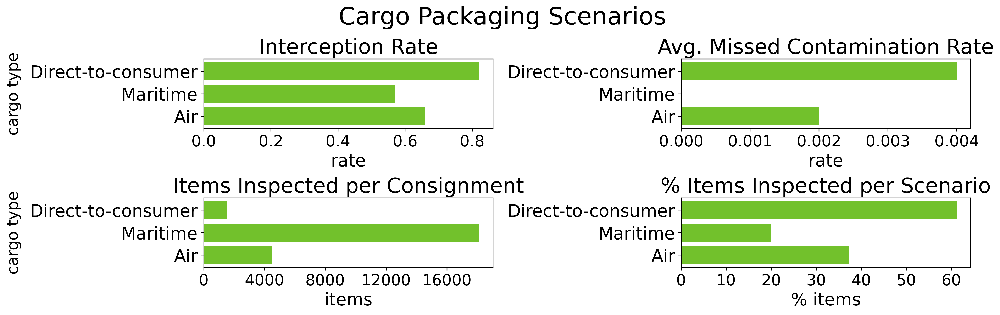

In [40]:
plt.figure(figsize=(16, 5), dpi=300)
plt.subplot(221)
plt.subplots_adjust(bottom=0.14,top=0.81, left=0.2, right=0.97, wspace=0.65, hspace=1)
plt.barh(df_cargo_10M_pretty["name"], df_cargo_10M_pretty["interception rate"], color=green)
plt.title("Interception Rate", fontsize=24)
plt.xlabel("rate", fontsize=20)
plt.ylabel("cargo type", fontsize=18, labelpad=10)
plt.yticks(ticks=np.arange(3),labels=df_cargo_10M_pretty["consignment name"], fontsize=20)
plt.xticks(ticks=[0.0,0.2,0.4,0.6,0.8],fontsize=18)
plt.subplot(222)
plt.barh(df_cargo_10M_pretty["name"], df_cargo_10M_pretty["avg missed contamination rate"], color=green)
plt.title("Avg. Missed Contamination Rate", fontsize=24)
plt.xlabel("rate", fontsize=20)
plt.yticks(ticks=np.arange(3),labels=df_cargo_10M_pretty["consignment name"],fontsize=20)
plt.xticks(ticks=[0,0.001,0.002,0.003,0.004], fontsize=18)

plt.subplot(223)
plt.barh(df_cargo_10M_pretty["name"], df_cargo_10M_pretty["avg items inspected per inspection"], color=green)
plt.title("Items Inspected per Consignment", fontsize=24)
plt.xlabel("items", fontsize=20)
plt.ylabel("cargo type", fontsize=18, labelpad=10)
plt.yticks(ticks=np.arange(3),labels=df_cargo_10M_pretty["consignment name"], fontsize=20)
plt.xticks(ticks=[0,4000,8000,12000,16000], fontsize=18)
plt.subplot(224)
plt.barh(df_cargo_10M_pretty["name"], df_cargo_10M_pretty["pct items inspected per simulation"], color=green)
plt.title("% Items Inspected per Scenario", fontsize=24)
plt.xlabel("% items", fontsize=20)
plt.yticks(ticks=np.arange(3),labels=df_cargo_10M_pretty["consignment name"], fontsize=20)
plt.xticks(fontsize=18)

plt.suptitle("Cargo Packaging Scenarios", fontsize=28)
plt.savefig(resultsdir / "cargo_config_scenario_10M_plots.png")
plt.show()

In [41]:
colors = {"Direct-to-consumer": green, "Air": light_blue, "Maritime":dark_blue}
patch_1 = mpatches.Patch(color=green, label="Direct-to-consumer")
patch_2 = mpatches.Patch(color=light_blue, label="Air")
patch_3 = mpatches.Patch(color=dark_blue, label="Maritime")

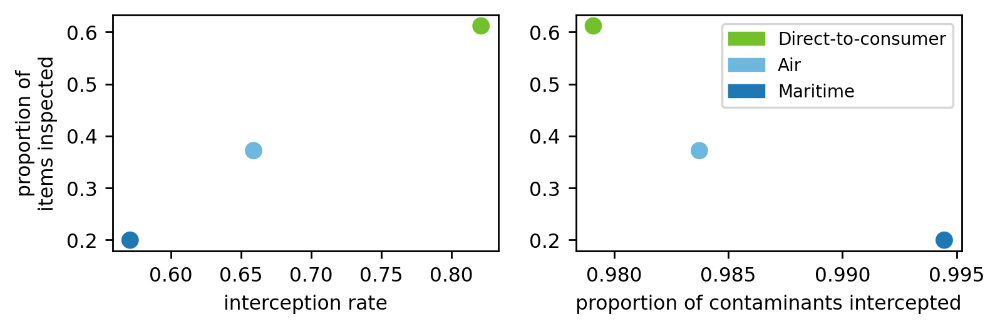

In [42]:
np.random.seed(9)

x_missed_cont = df_cargo_10M_pretty['intercepted contamininants'].divide(df_cargo_10M_pretty["intercepted contamininants"]+df_cargo_10M_pretty["missed contaminants"])
x_int_rate = df_cargo_10M_pretty['interception rate']
y = df_cargo_10M_pretty['pct items inspected per simulation'] * 0.01

plt.figure(figsize=(7,2), dpi=250)
plt.subplot(121)
plt.scatter(x_int_rate, y, s=7**2, alpha=1, marker="o", c=df_cargo_10M_pretty['consignment name'].replace(colors))
plt.xlabel("interception rate", size=9)
plt.ylabel("proportion of\nitems inspected", size=9)
plt.tick_params(axis='both', which='major', labelsize=9)

plt.subplot(122)
plt.scatter(x_missed_cont, y, s=7**2, alpha=1, marker="o", c=df_cargo_10M_pretty['consignment name'].replace(colors))
plt.xlabel("proportion of contaminants intercepted", size=9)
plt.tick_params(axis='both', which='major', labelsize=9)
plt.xticks(ticks=[0.98,0.985,0.99, 0.995])
plt.legend(handles=[patch_1,patch_2,patch_3], loc = "upper right", fontsize=8)

plt.savefig(resultsdir / "cargo_config_scenario_10M_scatter.png", bbox_inches='tight')

### Run contaminant arrangement scenarios

In [43]:
num_consignments = 3313
arrangement_scenario_results = run_scenarios(
    config=basic_config,
    scenario_table=consignment_scenario_table[9:],
    seed=42,
    num_simulations=100,
    num_consignments=num_consignments,
    detailed=False,
)

Running scenario: consignment scenario 10
Running scenario: consignment scenario 11
Running scenario: consignment scenario 12
Running scenario: consignment scenario 13
Running scenario: consignment scenario 14
Running scenario: consignment scenario 15
Running scenario: consignment scenario 16
Running scenario: consignment scenario 17
Running scenario: consignment scenario 18
Running scenario: consignment scenario 19
Running scenario: consignment scenario 20
Running scenario: consignment scenario 21
Running scenario: consignment scenario 22
Running scenario: consignment scenario 23
Running scenario: consignment scenario 24
Running scenario: consignment scenario 25
Running scenario: consignment scenario 26
Running scenario: consignment scenario 27


In [44]:
df_arrangement = save_scenario_result_to_pandas(
    arrangement_scenario_results,
    config_columns=[
        "name",
        "consignment name",
        "consignment/parameter_based/boxes/min",
        "consignment/parameter_based/boxes/max",
        "consignment/items_per_box/default",
        "contamination/contamination_unit",
        "contamination/contamination_rate/distribution",
        "contamination/contamination_rate/parameters",
        "contamination/arrangement",
        "contamination/clustered/distribution",
        "contamination/clustered/contaminated_units_per_cluster",
        "contamination/clustered/random/cluster_item_width",
    ],
    result_columns=[
        "true_contamination_rate",
        "max_missed_contamination_rate",
        "avg_missed_contamination_rate",
        "max_intercepted_contamination_rate",
        "avg_intercepted_contamination_rate",
        "avg_boxes_opened_completion",
        "pct_boxes_opened_completion",
        "avg_boxes_opened_detection",
        "pct_boxes_opened_detection",
        "avg_items_inspected_completion",
        "pct_items_inspected_completion",
        "avg_items_inspected_detection",
        "pct_items_inspected_detection",
        "false_neg",
        "intercepted",
        "total_missed_contaminants",
        "total_intercepted_contaminants",
    ],
)

In [45]:
df_arrangement['failure rate'] = df_arrangement["intercepted"] / num_consignments
contaminated_consignments = df_arrangement["false_neg"] + df_arrangement["intercepted"]
df_arrangement["interception rate"] = df_arrangement["intercepted"] / contaminated_consignments
df_arrangement["contaminated_consignments"] = contaminated_consignments
df_arrangement["% missed contaminants"] = ((df_arrangement["total_missed_contaminants"] / 
    (df_arrangement["total_missed_contaminants"] + df_arrangement["total_intercepted_contaminants"])) * 100)

In [46]:
# Format dataframe 
column_names = (["name", "consignment name", "items per box", "contamination unit", "contamination parameters", 
    "contaminant arrangement", "cluster distribution", "contaminated units per cluster", "cluster width", "avg contamination rate", 
    "avg missed contamination rate", "avg intercepted contamination rate", "avg boxes opened per inspection", 
    "pct box opened per simulation", "avg items inspected per inspection", "pct items inspected per simulation", 
    "missed contaminants", "intercepted contaminants", "interception rate", "contaminated_consignments", "% missed contaminants"])
df_arrangement_pretty = df_arrangement

In [47]:
df_arrangement_pretty.iloc[:,12:17] = df_arrangement_pretty.iloc[:,12:17].round(decimals=4)
df_arrangement_pretty.iloc[:,17:29] = df_arrangement_pretty.iloc[:,17:29].astype(int)
df_arrangement_pretty.iloc[:,29:31] = df_arrangement_pretty.iloc[:,29:31].round(decimals=4)
df_arrangement_pretty.iloc[:,[31]] = df_arrangement_pretty.iloc[:,[31]].astype(int)
df_arrangement_pretty.iloc[:,[32]] = df_arrangement_pretty.iloc[:,[32]].round(decimals=4)
df_arrangement_pretty = df_arrangement_pretty.iloc[:,[0,1,4,5,7,8,9,10,11,12,14,16,17,18,21,22,27,28,30,31,32]]
df_arrangement_pretty.columns = column_names

In [74]:
# Save results to csv
df_arrangement_pretty.to_csv(resultsdir / "arrangement_scenario_results.csv")

In [49]:
# If loading results from saved csv, uncomment and run this chunk.
#df_arrangement_pretty = pd.read_csv(resultsdir / "arrangement_scenario_results.csv")

In [50]:
item_cluster_cont = df_arrangement_pretty[(df_arrangement_pretty["cluster distribution"]=="continuous") & (df_arrangement_pretty["contamination unit"]=="item")]
rand_arrangement_item = df_arrangement_pretty[(df_arrangement_pretty["contaminant arrangement"]=="random") & (df_arrangement_pretty["contamination unit"]=="item")]

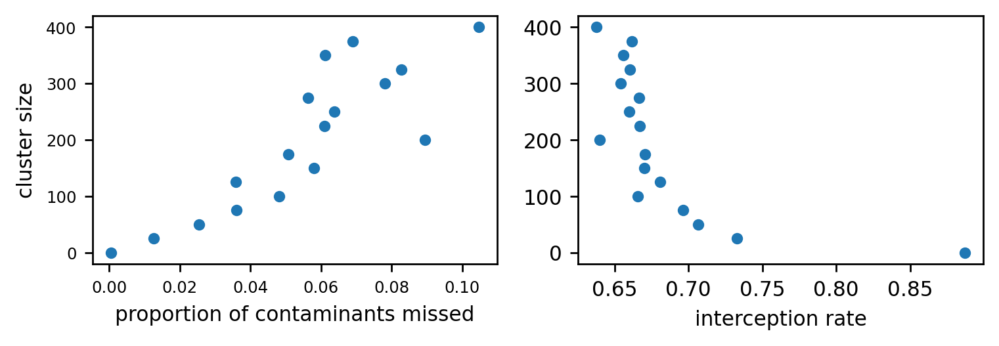

In [52]:
x = pd.concat([rand_arrangement_item["missed contaminants"], item_cluster_cont["missed contaminants"]]).reset_index(drop=True)
x = x.divide(pd.concat([rand_arrangement_item["intercepted contaminants"], item_cluster_cont["intercepted contaminants"]]).reset_index(drop=True) + x)
y = pd.concat([pd.Series(0), item_cluster_cont["contaminated units per cluster"]])

x_interception_rate = pd.concat([rand_arrangement_item["interception rate"], item_cluster_cont["interception rate"]]).reset_index(drop=True)
x_missed_rate = pd.concat([rand_arrangement_item["avg missed contamination rate"], item_cluster_cont["avg missed contamination rate"]]).reset_index(drop=True)

plt.figure(figsize=(7,2), dpi=250)
plt.subplot(121)
plt.scatter(x, y, s=4**2, alpha=1, marker="o")
plt.ylabel("cluster size", size=9)
plt.xlabel("proportion of contaminants missed", size=9)
plt.tick_params(axis='both', which='major', labelsize=7)
plt.ticklabel_format(axis="both", style="plain")

plt.subplot(122)
plt.scatter(x_interception_rate, y, s=4**2, alpha=1, marker="o")
plt.xlabel("interception rate", size=9)
plt.tick_params(axis='both', which='major', labelsize=9)
plt.ticklabel_format(axis="both", style="plain")

plt.savefig(resultsdir / "cluster_scenario_scatter.png", bbox_inches='tight')

### Run rate variability scenarios

In [53]:
num_consignments = 3313
variability_scenario_results = run_scenarios(
    config=basic_config,
    scenario_table=consignment_scenario_table[3:9],
    seed=42,
    num_simulations=100,
    num_consignments=num_consignments,
    detailed=False,
)

Running scenario: consignment scenario 4
Running scenario: consignment scenario 5
Running scenario: consignment scenario 6
Running scenario: consignment scenario 7
Running scenario: consignment scenario 8
Running scenario: consignment scenario 9


In [54]:
df_variability = save_scenario_result_to_pandas(
    variability_scenario_results,
    config_columns=[
        "name",
        "consignment name",
        "consignment/parameter_based/boxes/min",
        "consignment/parameter_based/boxes/max",
        "consignment/items_per_box/default",
        "contamination/contamination_unit",
        "contamination/contamination_rate/distribution",
        "contamination/contamination_rate/parameters",
        "contamination/arrangement",
        "contamination/clustered/distribution",
        "contamination/clustered/contaminated_units_per_cluster",
        "contamination/clustered/random/cluster_item_width",
    ],
    result_columns=[
        "true_contamination_rate",
        "max_missed_contamination_rate",
        "avg_missed_contamination_rate",
        "max_intercepted_contamination_rate",
        "avg_intercepted_contamination_rate",
        "avg_boxes_opened_completion",
        "pct_boxes_opened_completion",
        "avg_boxes_opened_detection",
        "pct_boxes_opened_detection",
        "avg_items_inspected_completion",
        "pct_items_inspected_completion",
        "avg_items_inspected_detection",
        "pct_items_inspected_detection",
        "false_neg",
        "intercepted",
        "total_missed_contaminants",
        "total_intercepted_contaminants",
    ],
)

In [55]:
df_variability['failure rate'] = df_variability["intercepted"] / num_consignments
contaminated_consignments = df_variability["false_neg"] + df_variability["intercepted"]
df_variability["interception rate"] = df_variability["intercepted"] / contaminated_consignments
df_variability["contaminated_consignments"] = contaminated_consignments
df_variability["% missed contaminants"] = ((df_variability["total_missed_contaminants"] / 
    (df_variability["total_missed_contaminants"] + df_variability["total_intercepted_contaminants"])) * 100)

In [56]:
# Format dataframe 
column_names = (["name", "consignment name", "items per box", "contamination unit", "contamination parameters", 
    "contaminant arrangement", "cluster distribution", "contaminated units per cluster", "cluster width", "avg contamination rate", 
    "avg missed contamination rate", "avg intercepted contamination rate", "avg boxes opened per inspection", 
    "pct box opened per simulation", "avg items inspected per inspection", "pct items inspected per simulation", 
    "missed contaminants", "intercepted contaminants", "interception rate", "contaminated_consignments", "% missed contaminants"])
df_variability_pretty = df_variability

In [57]:
df_variability_pretty.iloc[:,12:17] = df_variability_pretty.iloc[:,12:17].round(decimals=4)
df_variability_pretty.iloc[:,17:29] = df_variability_pretty.iloc[:,17:29].astype(int)
df_variability_pretty.iloc[:,29:31] = df_variability_pretty.iloc[:,29:31].round(decimals=4)
df_variability_pretty.iloc[:,[31]] = df_variability_pretty.iloc[:,[31]].astype(int)
df_variability_pretty.iloc[:,[32]] = df_variability_pretty.iloc[:,[32]].round(decimals=4)
df_variability_pretty = df_variability_pretty.iloc[:,[0,1,4,5,7,8,9,10,11,12,14,16,17,18,21,22,27,28,30,31,32]]
df_variability_pretty.columns = column_names

In [75]:
# Save results to csv
df_variability_pretty.to_csv(resultsdir / "ratevariability_scenario_results.csv")

In [59]:
# If loading results from saved csv, uncomment and run this chunk.
#df_variability_pretty = pd.read_csv(resultsdir / "ratevariability_scenario_results.csv")

In [60]:
variability_box_unit = df_variability_pretty[df_variability_pretty["contamination unit"] == "box"]
variability_item_unit = df_variability_pretty[df_variability_pretty["contamination unit"] == "item"]

In [61]:
rate_variability_dict = {"Low":0.01, "Mid":0.03, "High":0.05}
box_marker = Line2D([0], [0], marker='s', color="w", label='box contamination unit', markerfacecolor=dark_blue, markersize=8)
item_marker = Line2D([0], [0], marker='^', color="w", label='item contamination unit', markerfacecolor=green, markersize=9)

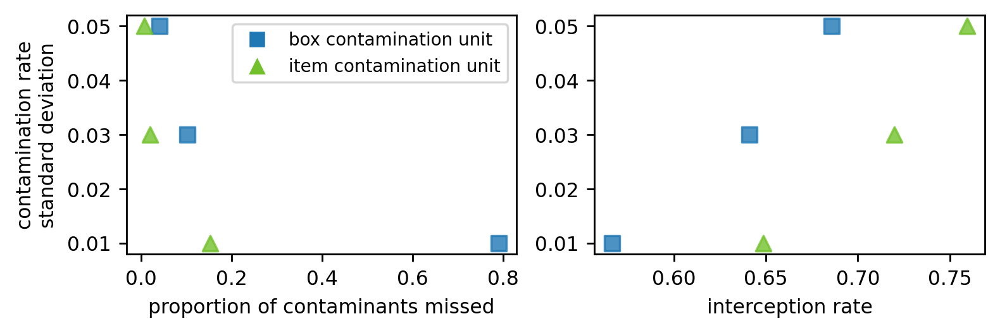

In [62]:
y_box = variability_box_unit["consignment name"].replace(rate_variability_dict)
y_item = variability_item_unit["consignment name"].replace(rate_variability_dict)

x_missed_cont_box = variability_box_unit["missed contaminants"] / variability_box_unit["intercepted contaminants"]
x_interception_rate_box = variability_box_unit["interception rate"]

x_missed_cont_item = variability_item_unit["missed contaminants"] / variability_item_unit["intercepted contaminants"]
x_interception_rate_item = variability_item_unit["interception rate"]

plt.figure(figsize=(7,2), dpi=250)
plt.subplot(121)
plt.scatter(x_missed_cont_box, y_box, s=7**2, alpha=0.8, marker="s", c=dark_blue)
plt.scatter(x_missed_cont_item, y_item, s=7**2, alpha=0.8, marker="^", c=green)
plt.ylabel("contamination rate\nstandard deviation", size=9)
plt.xlabel("proportion of contaminants missed", size=9)
plt.tick_params(axis='both', which='major', labelsize=9)
plt.ticklabel_format(axis="both", style="plain")
plt.legend(handles=[box_marker,item_marker], loc = "upper right", fontsize=8)

plt.subplot(122)
plt.scatter(x_interception_rate_box, y_box, s=7**2, alpha=0.8, marker="s", c=dark_blue)
plt.scatter(x_interception_rate_item, y_item, s=7**2, alpha=0.8, marker="^", c=green)
plt.xlabel("interception rate", size=9)
plt.tick_params(axis='both', which='major', labelsize=9)
plt.ticklabel_format(axis="both", style="plain")

plt.savefig(resultsdir / "ratevariability_scenario_scatter.png", bbox_inches='tight')

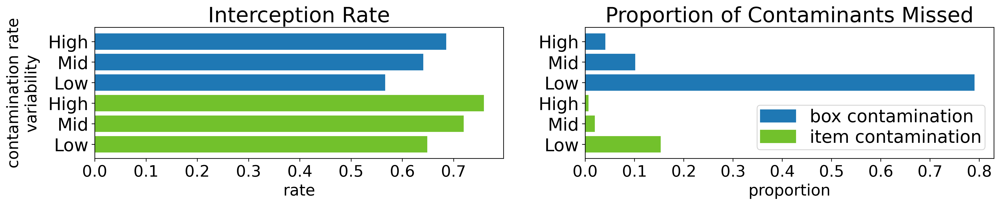

In [63]:
colors = {"item": green, "box": dark_blue}
patch_1 = mpatches.Patch(color=green, label="item contamination")
patch_2 = mpatches.Patch(color="#1f78b4", label="box contamination")

prop_missed_cont = df_variability_pretty["missed contaminants"] / df_variability_pretty["intercepted contaminants"]

plt.figure(figsize=(16, 4), dpi=300)
plt.subplot(121)
plt.subplots_adjust(bottom=0.25,top=0.77, left=0.08, right=0.97)
plt.barh(df_variability_pretty["name"].replace(rate_variability_dict), df_variability_pretty["interception rate"], color=df_variability_pretty['contamination unit'].replace(colors))
plt.title("Interception Rate", fontsize=24)
plt.xlabel("rate", fontsize=18)
plt.ylabel("contamination rate\nvariability", fontsize=18, labelpad=10)
plt.yticks(ticks=np.arange(6),labels=df_variability_pretty["consignment name"], fontsize=20)
plt.xticks(fontsize=18)
plt.subplot(122)
plt.barh(df_variability_pretty["name"].replace(rate_variability_dict), prop_missed_cont, color=df_variability_pretty['contamination unit'].replace(colors))
plt.title("Proportion of Contaminants Missed", fontsize=24)
plt.xlabel("proportion", fontsize=18)
plt.yticks(ticks=np.arange(6),labels=df_variability_pretty["consignment name"],fontsize=20)
plt.xticks(fontsize=18)
plt.legend(handles=[patch_2,patch_1], loc = "lower right", fontsize=20, borderpad=0.2, labelspacing=0.2)

plt.savefig(resultsdir / "rate_variability_scenario_plots.png")
plt.show()